<h1><center>Поиск изображения по запросу</center></h1>

## Введение

Нужно разработать демонстрационную версию поиска изображений по запросу.
Для демонстрационной версии необходимо обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

Данные лежат в папке /datasets/image_search/.

В файле train_dataset.csv находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке train_images содержатся изображения для тренировки модели.

В файле CrowdAnnotations.tsv — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

    Имя файла изображения.
    Идентификатор описания.
    Доля людей, подтвердивших, что описание соответствует изображению.
    Количество человек, подтвердивших, что описание соответствует изображению.
    Количество человек, подтвердивших, что описание не соответствует изображению.

В файле ExpertAnnotations.tsv содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

    Имя файла изображения.
    Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле test_queries.csv находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке test_images содержатся изображения для тестирования модели.

## Обзор данных


In [1]:
import pandas as pd
import numpy as np
import random

from nltk.corpus import stopwords 
from PIL import Image
import re
import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import TfidfVectorizer

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, f1_score
from sklearn.metrics import mean_squared_error, log_loss
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import accuracy_score

import keras
from keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet import ResNet50
from keras.optimizers import Adam
from keras.applications.imagenet_utils import decode_predictions
from keras import backend as K
from keras.utils import load_img 
from keras.utils import img_to_array


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None
print()

Отдельно импортируем tensorflow

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text

Загрузим данные и сделаем обзор

In [3]:
crowd = pd.read_csv("datasets/to_upload/CrowdAnnotations.tsv", sep='\t', header=None, names=["image", "query_id", "perc_pos", "num_pos", "num_neg"])
expert = pd.read_csv("datasets/to_upload/ExpertAnnotations.tsv", sep='\t', header=None, names=["image", "query_id", "exp_1", "exp_2", "exp_3"])
train_dataset = pd.read_csv("datasets/to_upload/train_dataset.csv", header=0)
test_query = pd.read_csv("datasets/to_upload/test_queries.csv", header=0, sep="|")
test_images = pd.read_csv("datasets/to_upload/test_images.csv")

In [4]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [5]:
crowd.head()

,image,query_id,perc_pos,num_pos,num_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [6]:
expert.head()

,image,query_id,exp_1,exp_2,exp_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [7]:
train_dataset.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [8]:
test_images.head()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


Посмотрим кол-во уникальных изображений в трейне и тесте

In [9]:
len(train_dataset["image"].unique())

1000

In [10]:
len(test_images["image"].unique())

100

Разница 1 к 10

Посмотрим кол-во уникальных запросов в трейне и тесте

In [11]:
len(train_dataset["query_text"].unique())

977

In [12]:
len(test_query["query_text"].unique())

500

В тесте в 2 раза меньше уникальных запросов, чем в трейне

Посмотрим кол-во оценок в экспертном и крудсорс сетах

In [13]:
len(expert.groupby(by=["image", "query_id"]))

5822

In [14]:
len(crowd.groupby(by=["image", "query_id"]))

47830

В краудсорс оценок в 6 раз больше, чем в экспертных

## Обработка данных

Дропанем ненужные колонки, переименуем таргет

In [15]:
crowd = crowd.drop(columns={"num_pos", "num_neg"})
crowd = crowd.rename(columns={"perc_pos": "target_crowd"})

In [16]:
sum(crowd.duplicated())

0

Соберем оценки expert в лист

In [17]:
expert["exp_all"] = expert[["exp_1", "exp_2", "exp_3"]].values.tolist()

Сделаем функции для нахождения мажоритарного большинства

In [18]:
def most_frequent(List):
    return max(set(List), key = List.count)

def is_unique_values(x):
    if len(x) > len(set(x)):
        return 0
    else:
        return 1    

Применим их

In [19]:
expert = expert[expert['exp_all'].apply(is_unique_values) == 0]
expert.reset_index(drop=True, inplace=True)

In [20]:
expert["target_expert"] = expert["exp_all"].apply(most_frequent)

In [21]:
expert = expert.drop(columns={"exp_1", "exp_2", "exp_3", "exp_all"})

Посмотрим, что получилось

In [22]:
expert["target_expert"].value_counts()

1    3327
2    1566
3     492
4     311
Name: target_expert, dtype: int64

In [23]:
expert["target_expert"] = (expert["target_expert"] - 1.0) / 3.0


In [24]:
expert["target_expert"].value_counts()

0.000000    3327
0.333333    1566
0.666667     492
1.000000     311
Name: target_expert, dtype: int64

In [25]:
crowd.head()

,image,query_id,target_crowd
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


In [26]:
expert.head()

,image,query_id,target_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000


Замержим crowd и expert оценки

In [27]:
crowd_expert = crowd.merge(expert, how="outer", on=["image", "query_id"])

In [28]:
crowd_expert.head()

,image,query_id,target_crowd,target_expert
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,NaN
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,NaN
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,NaN
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,NaN
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,NaN


Заменим пропуски

In [29]:
crowd_expert["target_crowd"].fillna(crowd_expert["target_expert"], inplace=True)
crowd_expert["target_expert"].fillna(crowd_expert["target_crowd"], inplace=True)

In [30]:
sum(crowd_expert["target_expert"].isna()), sum(crowd_expert["target_crowd"].isna())

(0, 0)

Сделаем суммарный таргет

In [31]:
crowd_expert["target"] = crowd_expert["target_expert"]*0.6 + crowd_expert["target_crowd"]*0.4

Посмотрим его распределение

<AxesSubplot:>

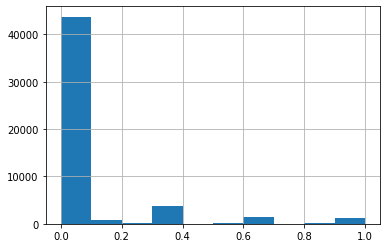

In [32]:
crowd_expert["target"].hist()

In [33]:
crowd_expert["target"].value_counts(normalize=True).head()

0.000000    0.852540
0.333333    0.053776
1.000000    0.025201
0.666667    0.023543
0.200000    0.015702
Name: target, dtype: float64

Очень много нулей

Удалим ненужные колонки

In [34]:
crowd_expert = crowd_expert.drop(columns={"target_crowd", "target_expert"})
crowd_expert.head()

,image,query_id,target
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


Посмотрим длину получившегося сета с оценками

In [35]:
len(crowd_expert)

51268

Выделим уникальные тексты

In [36]:
train_text_unique = train_dataset[["query_id", "query_text"]].drop_duplicates()

Выделим уникальные картинки

In [37]:
train_images_unique = train_dataset["image"].drop_duplicates().to_frame()

Посмотрим длину сета уникальных предложений и картинок

In [38]:
len(train_text_unique), len(train_images_unique)

(977, 1000)

Проверим, все ли картинки в тесте разные

In [39]:
len(test_images), len(test_images["image"].unique())

(100, 100)

## Векторизация текста

Будем использовать small BERT


Скачаем модель

In [40]:
bert_prep_text = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")
bert_encoding = hub.KerasLayer("https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/2")

Создадим функцию для получения ембеддингов

In [41]:
def get_text_embedding(text):
    prep_text = bert_prep_text(text)
    return bert_encoding(prep_text)

Возьмем только первый токен

In [42]:
text_train_embeddings = get_text_embedding(train_text_unique["query_text"])["sequence_output"][:,0,:].numpy()

Посмотрим получившийся размер

In [43]:
text_train_embeddings.shape

(977, 128)

In [44]:
train_text_unique["bert_embedding"] = text_train_embeddings.tolist()

Сделаем тоже самое для тестовой выборки

In [45]:
test_text_embeddings = get_text_embedding(test_query["query_text"])["sequence_output"][:,0,:].numpy()

In [46]:
test_text_embeddings.shape

(500, 128)

In [47]:
test_query["bert_embedding"] = test_text_embeddings.tolist()

## Векторизация изображения

In [48]:
datagen = ImageDataGenerator(rescale=1.0/255.0)
path = "/datasets/to_upload/"

train_datagen = datagen.flow_from_dataframe(
    dataframe=train_images_unique,
    directory="datasets/to_upload/train_images",
    x_col = "image",
    class_mode = None,
    target_size=(224, 224),
    batch_size=1,
    shuffle=False,
    seed=12345)

test_datagen = datagen.flow_from_dataframe(
    dataframe=test_images,
    directory="datasets/to_upload/test_images",
    x_col = "image",
    class_mode = None,
    target_size=(224, 224),
    batch_size=1,
    shuffle=False,
    seed=12345)    

Found 1000 validated image filenames.
Found 100 validated image filenames.


Будем использовать ResNet50

In [49]:
def create_model():
    backbone = ResNet50(input_shape=(224, 224, 3),
                    weights='imagenet',
                    include_top=False)

    optimizer = Adam(learning_rate=0.0002)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())

    model.compile(optimizer=optimizer, loss=None, metrics=None)

    return model

In [50]:
model = create_model()

In [51]:
def get_image_features(datagen, model):
    img_features = []
    for i in range(datagen.samples):
        features = next(datagen)
        pred = model.predict(features, verbose=0).flatten()
        img_features.append(pred)

    return img_features

Получим вектора

In [52]:
train_images_unique["image_embedding"] = get_image_features(train_datagen, model)
test_images["image_embedding"] = get_image_features(test_datagen, model)

In [53]:
train_images_unique["image_embedding"][0].shape

(2048,)

Замержим полученные вектора текста и изображений в датасет с оценками

Замержим ембединги картинок

In [54]:
crowd_expert = crowd_expert.merge(train_images_unique, how="inner", on="image")
test_query = test_query.merge(test_images, how="inner", on="image")

Замержим ембединги текстов

In [55]:
crowd_expert = crowd_expert.merge(train_text_unique[["bert_embedding", "query_text", "query_id"]], how="inner", on="query_id")

Посмотрим, что получилось

In [56]:
crowd_expert.head()

,image,query_id,target,image_embedding,bert_embedding,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,"[0.0, 0.0, 0.007829977, 0.0, 1.2201945, 0.0, 0...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
1,2182488373_df73c7cc09.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.0, 0.04359647, 0.84361905, 0.0, 0...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
2,2594042571_2e4666507e.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.0, 0.068879336, 1.073498, 0.0, 0....","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
3,2647049174_0fb47cee2e.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.0, 0.0, 1.2276341, 0.0, 0.0, 0.98...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
4,2843695880_eeea6c67db.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.0, 0.0, 1.1332985, 0.0, 0.0, 0.98...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."


Создадим набор запрещенных слов

In [57]:
detect_words = ["kid", "teen", "teens", "toddler", "toddlers", "child", "young",
                "children", "kids", "baby", "babies", "boy", "boys", "girl", "girls"]

Уберем из трейна все запросы, содержащие запрещенные слова, но при условии, что таргет больше или равно 0.3

In [58]:
len(crowd_expert["image"].unique())

1000

Создадим сет плохих картинок

In [59]:
bad_images = crowd_expert[( (crowd_expert["query_text"].str.contains('|'.join(detect_words))) & (crowd_expert["target"] >= 0.7) )]["image"].unique()

Оценим их глазами

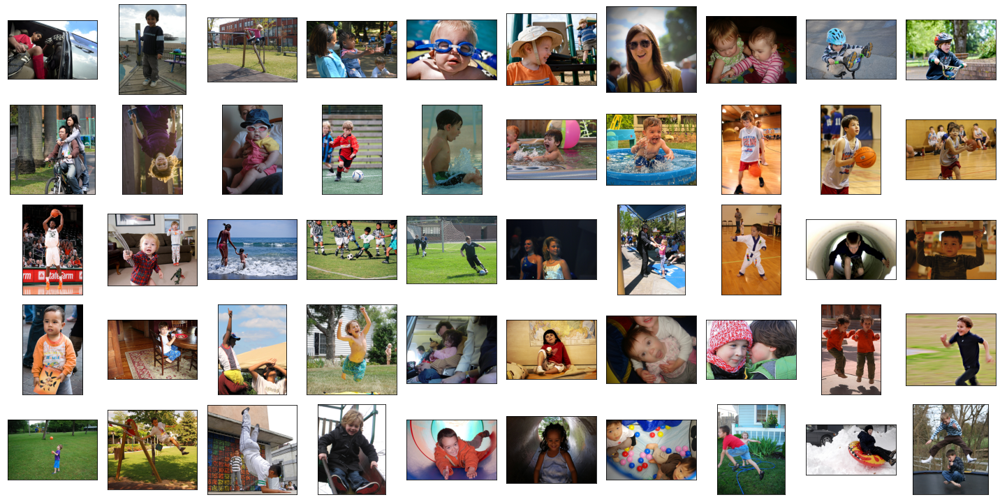

In [60]:
fig = plt.figure(figsize=(20,20))
for i, bad_image in enumerate(bad_images[:50]):
    img = Image.open(f"datasets/to_upload/train_images/{bad_image}")
    fig.add_subplot(10, 10, i+1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Да - это фотографии детей

Очистим от них наш сет

In [61]:
crowd_expert_clear = crowd_expert[~crowd_expert["image"].isin(bad_images)].reset_index(drop=True)

Посмотрим, сколько осталось картинок

In [62]:
len(crowd_expert_clear["image"].unique())

792

Посмотрим общию длину полученного сета с оценками

In [63]:
len(crowd_expert_clear)

39173

# Разделение данных

Разделим данные на трейн и валидацию, используя GroupShuffleSplit для того, чтобы одни и теже картинки не попали в обе выборки

In [64]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=1)
train_indices, valid_indices = next(gss.split(X=crowd_expert_clear.drop(columns=['target']),
                                              y=crowd_expert_clear['target'],
                                              groups=crowd_expert_clear['image']))

train, valid = crowd_expert_clear.loc[train_indices], crowd_expert_clear.loc[valid_indices]

len(train), len(valid)

(31263, 7910)

## Создание нейронной сети

Подготовим данные. Соеденим полученные ембединги для картинок и текста от Bert

In [65]:
train.head()

,image,query_id,target,image_embedding,bert_embedding,query_text
2,2843695880_eeea6c67db.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.0, 0.0, 1.1332985, 0.0, 0.0, 0.98...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
3,2892995070_39f3c9a56e.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.00024637883, 0.0, 1.1307358, 0.0,...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
6,311146855_0b65fdb169.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.0, 0.0, 1.2682031, 0.0, 0.0, 0.66...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
7,3197981073_3156963446.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.0, 0.0, 1.2595186, 0.0, 0.0, 0.91...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."
8,3218480482_66af7587c8.jpg,1056338697_4f7d7ce270.jpg#2,0.0,"[0.0, 0.0, 0.008654792, 0.0, 0.96982837, 0.0, ...","[-0.19415780901908875, 0.5362820029258728, -3....","A woman is signaling is to traffic , as seen f..."


Выделим таргет

In [66]:
y_train = train["target"]
y_valid = valid["target"]

Соберем ембединги

In [67]:

train_image_features = train["image_embedding"].apply(pd.Series)
train_text_features = train["bert_embedding"].apply(pd.Series)

valid_image_features = valid["image_embedding"].apply(pd.Series)
valid_text_features = valid["bert_embedding"].apply(pd.Series)

X_train = pd.concat([train_image_features, train_text_features], axis=1)
X_valid = pd.concat([valid_image_features, valid_text_features], axis=1)

Посмотрим на распределение таргета в трейне

<AxesSubplot:>

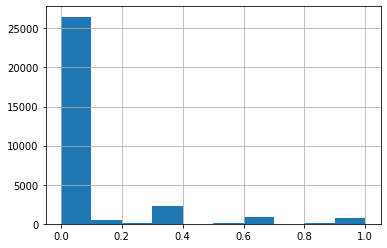

In [68]:
train["target"].hist()

Распределение таргета на валидации

<AxesSubplot:>

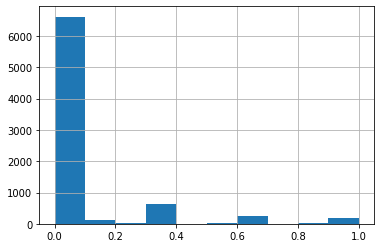

In [69]:
valid["target"].hist()

И там и там очень много нулей

Сравним длины получившихся ембедингов

In [70]:
valid_image_features.shape, valid_text_features.shape

((7910, 2048), (7910, 128))

Построим модель регрессии и посмотрим результат. Будет использовать сигмойду на выходящем нейроне. 

Сделаем функцию для rmse и будем использовать его, как метрику

In [71]:
def rmse(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))

In [72]:
model_reg = Sequential()
model_reg.add(Dense(256, input_shape=(X_train.shape[1],), activation='relu'))
model_reg.add(BatchNormalization(input_shape=(256,)))
model_reg.add(Dense(128, activation='tanh'))
model_reg.add(BatchNormalization(input_shape=(128,)))
model_reg.add(Dense(64, activation='tanh'))
model_reg.add(BatchNormalization(input_shape=(64,)))
model_reg.add(Dense(32, activation='tanh'))
model_reg.add(BatchNormalization(input_shape=(32,)))
model_reg.add(Dense(1, activation='sigmoid'))

opt = keras.optimizers.Adam(learning_rate=0.01)
model_reg.compile(loss="mse", optimizer='adam', metrics=rmse)

model_reg.fit(X_train, y_train, validation_data=(X_valid, y_valid), epochs=10, batch_size=16)

Epoch 1/10
1954/1954 [==============================] - 5s 2ms/step - loss: 0.0521 - rmse: 0.2084 - val_loss: 0.0435 - val_rmse: 0.1857
Epoch 2/10
1954/1954 [==============================] - 4s 2ms/step - loss: 0.0423 - rmse: 0.1892 - val_loss: 0.0454 - val_rmse: 0.1912
Epoch 3/10
1954/1954 [==============================] - 5s 2ms/step - loss: 0.0419 - rmse: 0.1878 - val_loss: 0.0432 - val_rmse: 0.1830
Epoch 4/10
1954/1954 [==============================] - 4s 2ms/step - loss: 0.0417 - rmse: 0.1877 - val_loss: 0.0451 - val_rmse: 0.1864
Epoch 5/10
1954/1954 [==============================] - 4s 2ms/step - loss: 0.0416 - rmse: 0.1876 - val_loss: 0.0428 - val_rmse: 0.1823
Epoch 6/10
1954/1954 [==============================] - 5s 2ms/step - loss: 0.0413 - rmse: 0.1872 - val_loss: 0.0434 - val_rmse: 0.1832
Epoch 7/10
1954/1954 [==============================] - 4s 2ms/step - loss: 0.0411 - rmse: 0.1865 - val_loss: 0.0437 - val_rmse: 0.1819
Epoch 8/10
1954/1954 [==========================

С движением по эпохам, результат почти не меняется

Попробуем посмотреть на значения предикта модели на валидации

In [73]:
valid_pred = model_reg.predict(X_valid)

248/248 [==============================] - 0s 943us/step


In [74]:
valid_pred.shape

(7910, 1)

In [75]:
valid_pred = valid_pred.reshape(7910,)

Посмотрим распределение

<AxesSubplot:>

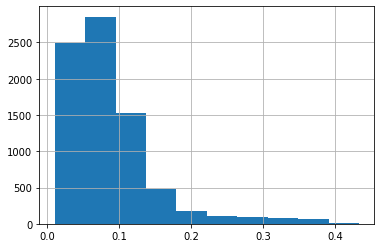

In [76]:
pd.Series(valid_pred).hist()

почти все значения меньше 0.5

Теперь попробуем решить задачу классификации. Приведем таргет к бинарному

In [77]:
y_train_binary = round(train["target"])
y_train_binary.value_counts()

0.0    29442
1.0     1821
Name: target, dtype: int64

In [78]:
y_valid_binary = round(valid["target"])
y_valid_binary.value_counts()

0.0    7417
1.0     493
Name: target, dtype: int64

Зададим балансировку весов

In [79]:
weight_for_0 = (1 / sum(y_train == 0)) * (len(y_train) / 2.0)
weight_for_1 = (1 / sum(y_train == 1)) * (len(y_train) / 2.0)

weight_for_0, weight_for_1

(0.5900683250915405, 20.406657963446474)

In [80]:
class_weight = {0: weight_for_0, 1: weight_for_1}

Напишем метрики recall, precision, f1

In [81]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

Сделаем модель классификации

In [82]:
model_cl = Sequential()
model_cl.add(Dense(256, input_shape=(X_train.shape[1],), activation='relu'))
model_cl.add(BatchNormalization(input_shape=(256,)))
model_cl.add(Dense(128, activation='tanh'))
model_cl.add(BatchNormalization(input_shape=(128,)))
model_cl.add(Dense(64, activation='tanh'))
model_cl.add(BatchNormalization(input_shape=(64,)))
model_cl.add(Dense(32, activation='tanh'))
model_cl.add(BatchNormalization(input_shape=(32,)))
model_cl.add(Dense(1, activation='sigmoid'))

opt = keras.optimizers.Adam(learning_rate=0.01)
model_cl.compile(loss='binary_crossentropy', optimizer='adam', metrics=[recall_m, precision_m, f1_m])

model_cl.fit(X_train, y_train, validation_data=(X_valid, y_valid), epochs=15, batch_size=16, class_weight=class_weight)

# _, valid_f1 = model.evaluate(X_valid, y_valid_binary)
# _, train_f1 = model.evaluate(X_train, y_train_binary)


Epoch 1/15
1954/1954 [==============================] - 6s 3ms/step - loss: 0.7286 - recall_m: 0.2156 - precision_m: 0.0509 - f1_m: 0.0792 - val_loss: 0.5824 - val_recall_m: 0.1168 - val_precision_m: 0.0295 - val_f1_m: 0.0427
Epoch 2/15
1954/1954 [==============================] - 5s 2ms/step - loss: 0.6958 - recall_m: 0.1983 - precision_m: 0.0495 - f1_m: 0.0758 - val_loss: 0.6454 - val_recall_m: 0.1357 - val_precision_m: 0.0309 - val_f1_m: 0.0464
Epoch 3/15
1954/1954 [==============================] - 5s 2ms/step - loss: 0.6895 - recall_m: 0.2066 - precision_m: 0.0491 - f1_m: 0.0763 - val_loss: 0.6586 - val_recall_m: 0.1667 - val_precision_m: 0.0310 - val_f1_m: 0.0488
Epoch 4/15
1954/1954 [==============================] - 5s 2ms/step - loss: 0.6812 - recall_m: 0.2091 - precision_m: 0.0487 - f1_m: 0.0762 - val_loss: 0.6336 - val_recall_m: 0.1492 - val_precision_m: 0.0308 - val_f1_m: 0.0471
Epoch 5/15
1954/1954 [==============================] - 5s 3ms/step - loss: 0.6745 - recall_m: 0

Все три метрики очень низкие

## Детектор запрещенного контента и проверка на тесте

Сделаем функцию которая принимает запрос и находит релевантнове изображение

Создадим список слов, обозначающих человека, младше 16 лет

In [83]:
detect_words = ["kid", "teen", "toddler", "child", "young", "little girl", "little boy",
                "children", "kids", "baby", "babies", "boy", "boys", "girl", "girls"]


Подготовим тестовую выборку

Напишем функцию поиска изображения по запросу(поле text). Будем искать топ-n лучших изображений для запроса. А также 2 вспомогательные функции, для детекта запрещенных слов и поиска подходщих изображений. Возьмем нейронную сеть для классификации.

In [84]:
def best_img(text, test_query, img_count):
    if is_query_check_ok(text):
        return find_img(text, test_query, img_count)
    else:    
        return (text, "This image is unavailable in your country in compliance with local laws")

def is_query_check_ok(text):
    if any(word in text.lower() for word in detect_words):
        return False
    else:
        return True

# return text query and top 5 best img indexes
def find_img(text, test_query_pred, img_count):

    query_emb = test_query_pred[test_query_pred["query_text"] == text]["bert_embedding"].tolist()
    test_sample = test_query_pred[["image_embedding", "bert_embedding"]]
    test_sample["bert_embedding"] = len(test_sample) * query_emb

    test_image_features = test_sample["image_embedding"].apply(pd.Series)
    test_text_features = test_sample["bert_embedding"].apply(pd.Series)

    X_test = pd.concat([test_image_features, test_text_features], axis=1)

    pred = model_cl.predict(X_test)
    
    test_query_pred["predict"] = pred
    top_score = test_query_pred[["predict", 'image']].max(axis=1).sort_values(ascending=False)[:img_count]
    print(top_score)
    return (text, top_score)

Создадим список уникальных запросов из теста

Сделаем генератор запросов

In [85]:
query_count = 10

random_10_queries = []
for _ in range(query_count):
    random_query = random.choice(test_query["query_text"])
    random_10_queries.append(random_query)

Проверим

In [86]:
random_10_queries

['A little kid splashes around in the kiddie pool while a lady watches .',
 'a black and grey dog catches a tennis ball at the beach',
 'The heavy man is sitting on a bus and sleeping .',
 'The man is performing a trick with an orange bicycle .',
 'A man wearing a vest and pants walks across stage at a concert .',
 'A young girl with goggles and floaties poses for the camera as she plays in a pool .',
 'A black man in a blue shirt stands next to a black man in a red robe .',
 'A girl on skis in snow .',
 'A large bird spreading his wings in flight over a body of water .',
 'Two women in head wraps .']

Получим результат работы нашей модели

In [87]:
results = []
test_query_pred = test_query.copy()
for random_query in random_10_queries:
    results.append(find_img(random_query, test_query_pred, img_count=1))

16/16 [==============================] - 0s 1000us/step
235    0.33271
dtype: float32
16/16 [==============================] - 0s 1000us/step
357    0.7786
dtype: float32
16/16 [==============================] - 0s 1ms/step
359    0.401228
dtype: float32
16/16 [==============================] - 0s 933us/step
470    0.828729
dtype: float32
16/16 [==============================] - 0s 1000us/step
309    0.779984
dtype: float32
16/16 [==============================] - 0s 1000us/step
235    0.472619
dtype: float32
16/16 [==============================] - 0s 1000us/step
61    0.4247
dtype: float32
16/16 [==============================] - 0s 1000us/step
306    0.506968
dtype: float32
16/16 [==============================] - 0s 999us/step
358    0.823033
dtype: float32
16/16 [==============================] - 0s 1000us/step
78    0.752265
dtype: float32


Посмотрим, что получилось

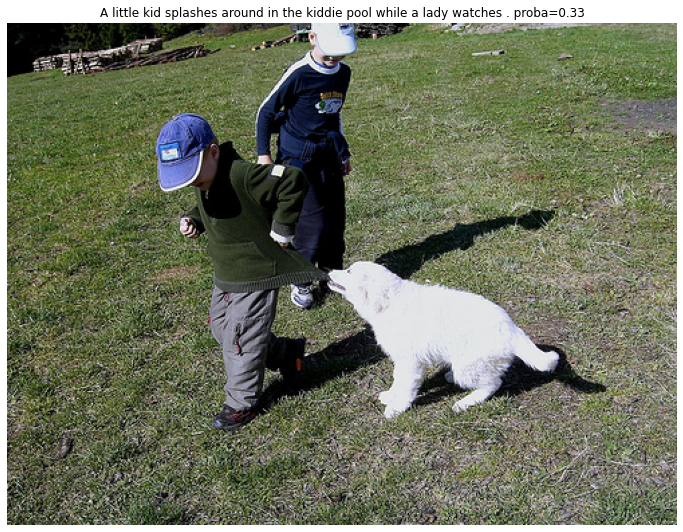

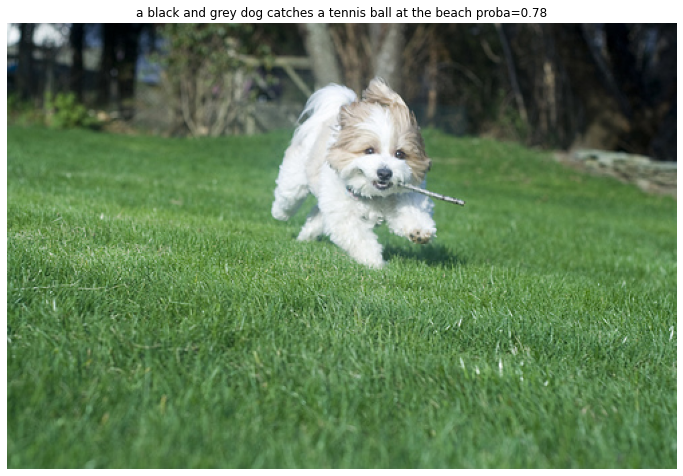

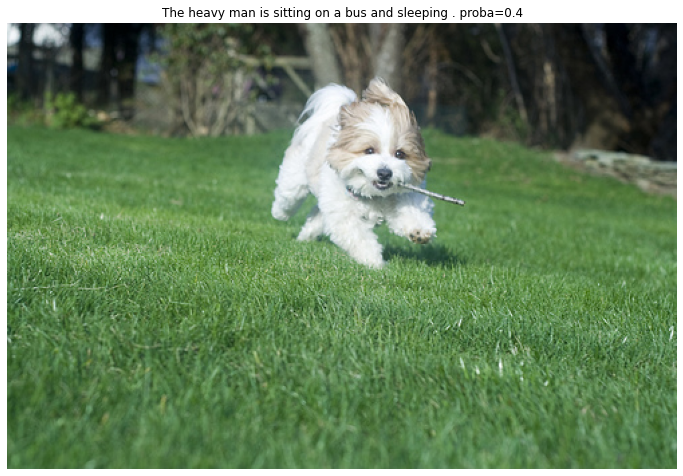

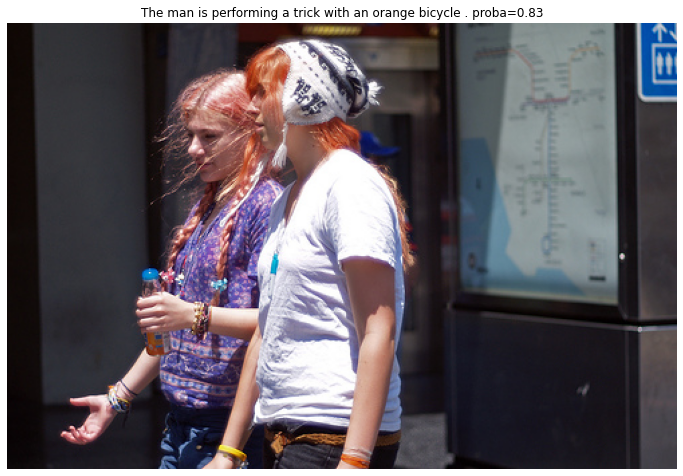

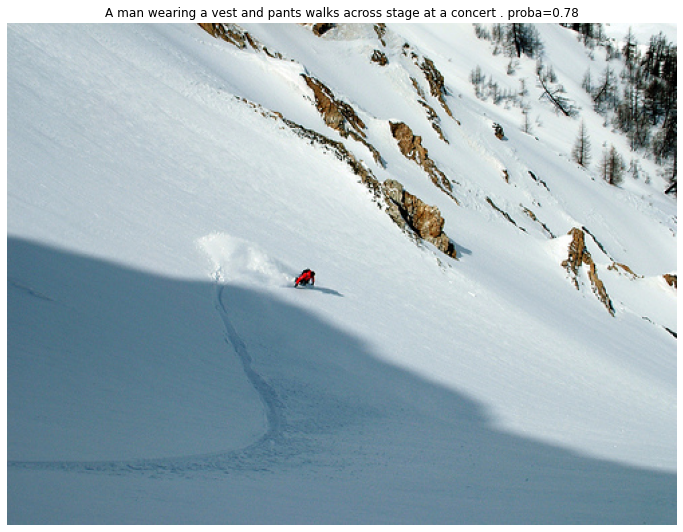

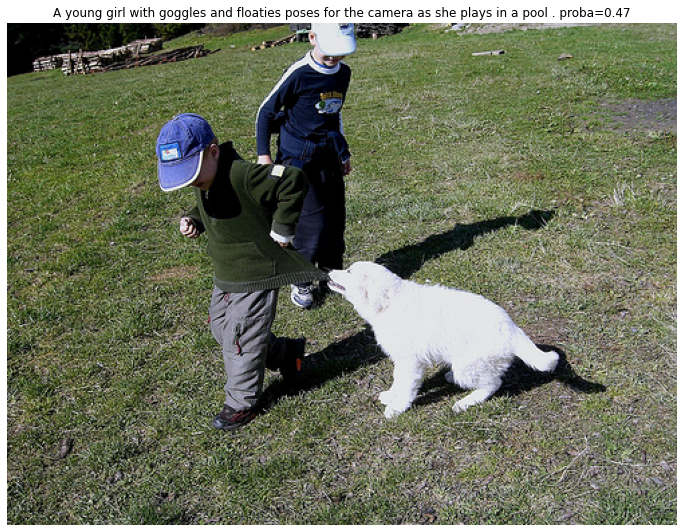

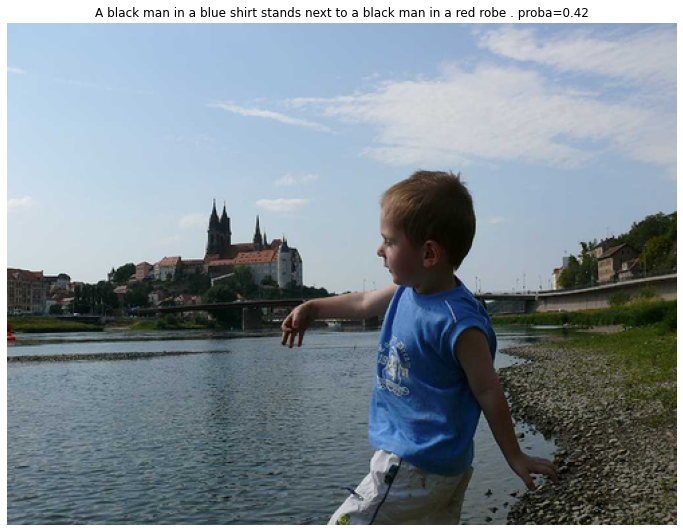

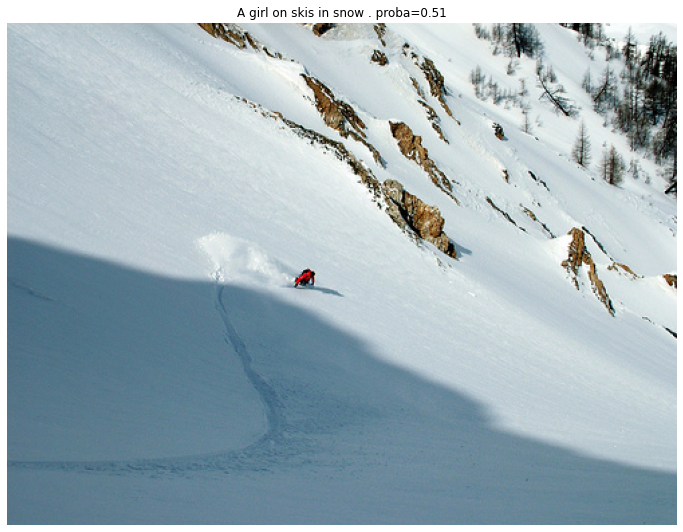

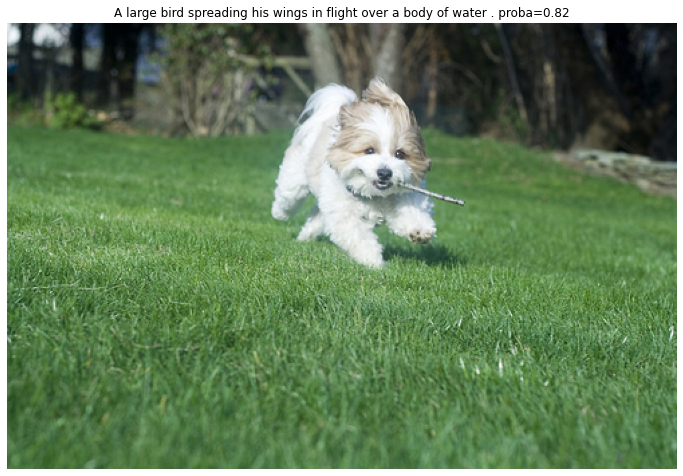

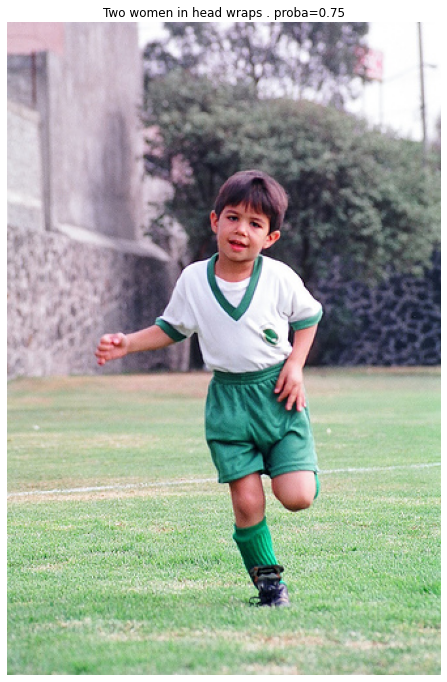

In [88]:
for result in results:
    text, top_score = result
    if not isinstance(top_score, str):
        for score, index in zip(top_score, top_score.index):
            image_name = test_query["image"].loc[index]
            img = Image.open(f"datasets/to_upload/test_images/{image_name}")
            plt.figure(figsize=(12,12))
            plt.axis ('off')
            plt.imshow(img)
            plt.title(text + " proba=" + str(round(score,2)))
    else:
        print(text)
        print("This image is unavailable in your country in compliance with local laws")

Детектор срабатывает, а релевантные картинки не подходят

## Использование CLIP

In [ ]:
from sentence_transformers import SentenceTransformer, util

In [ ]:
#Load CLIP model
model = SentenceTransformer('clip-ViT-B-32')

Сделаем функцию для получения ембеддингов изображений

In [ ]:
def get_image_features(dataset, model):
    
    img_features = []
    for i in range(len(dataset)):
        img_name = dataset.iloc[i]['image']
        img_emb = model.encode(Image.open(f"datasets/to_upload/test_images/{img_name}"))
        img_features.append(img_emb)

    return img_features

In [ ]:
test_images['img_emb'] = get_image_features(test_images, model)

## Векторизация текста

Получим ембединги запросов

In [ ]:
test_query['text_emb'] = model.encode(test_query['query_text']).tolist()

Проверим размерность получившихся ембедингов запросов и изображений

In [ ]:
len(test_images['img_emb'][0]), len(test_query['text_emb'][0])

(512, 512)

## Инференс

Напишем функцию поиска изображения по запросу(поле text). Будем искать топ-n лучших изображений для запроса. А также 2 вспомогательные функции, для детекта запрещенных слов и поиска подходщих изображений. Возьмем нейронную сеть для классификации.

In [ ]:
detect_words = ["kid", "teen", "teens", "toddler", "toddlers", "child", "young",
                "children", "kids", "baby", "babies", "boy", "boys", "girl", "girls"]

In [ ]:
def find_img(text, test_query, test_images, img_count):
    if is_query_check_ok(text):
        return find_n_best_img(text, test_query, test_images, img_count)
    else:    
        return (text, "This image is unavailable in your country in compliance with local laws")

def is_query_check_ok(text):
    if any(word in text.lower() for word in detect_words):
        return False
    else:
        return True

# return text query and top n best img indexes
def find_n_best_img(text, test_query, test_images, img_count):
    text_emb = test_query.loc[test_query["query_text"]==text]['text_emb'].values[0]
    test_images['cos_sim_score'] = util.cos_sim(test_images['img_emb'], text_emb)
    top_img_score = test_images.sort_values(by='cos_sim_score', ascending=False).head(img_count)

    return (text, top_img_score)

Сделаем генератор запросов

In [ ]:
query_count = 10

random_10_queries = []
for _ in range(query_count):
    random_query = random.choice(test_query["query_text"])
    random_10_queries.append(random_query)

Проверим

In [ ]:
random_10_queries

['Little boy standing on the bank of a river .',
 'Little girl on skis',
 'A child sits in the woods looking up with binoculars .',
 'A group of people walk through a shopping mall .',
 'A brown dog sits still on a hillside .',
 'A woman works by a sewing machine .',
 'A man is doing a jump on a wakeboard in the water .',
 'A tan dog runs through the brush .',
 'An ice skating park in winter , with many people .',
 'A girl is wearing a purple sash and matching skirt .']

Получим результат работы нашей модели

In [ ]:
results = []
test_query_inference = test_query.copy()
test_images_inference = test_images.copy()

for random_query in random_10_queries:
    results.append(find_img(text=random_query,
                            test_query=test_query_inference,
                            test_images=test_images_inference,
                            img_count=1))

Посмотрим, что получилось

Little boy standing on the bank of a river .
This image is unavailable in your country in compliance with local laws
Little girl on skis
This image is unavailable in your country in compliance with local laws
A child sits in the woods looking up with binoculars .
This image is unavailable in your country in compliance with local laws
A girl is wearing a purple sash and matching skirt .
This image is unavailable in your country in compliance with local laws


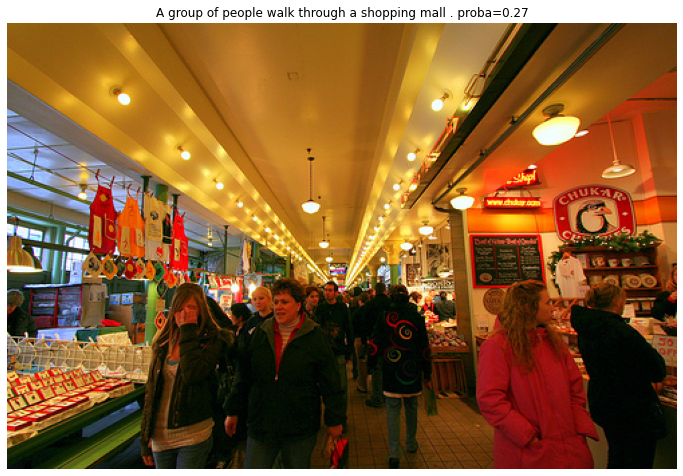

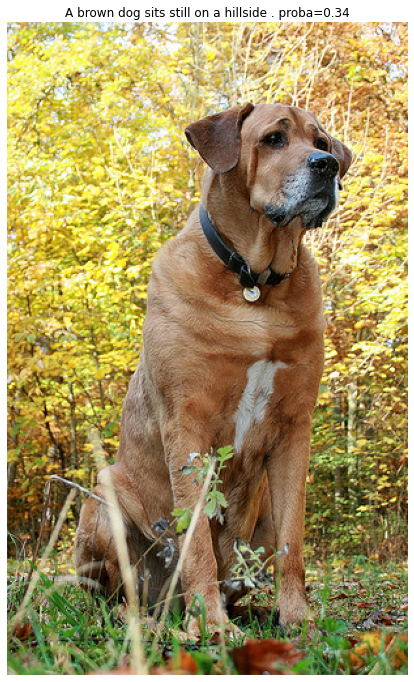

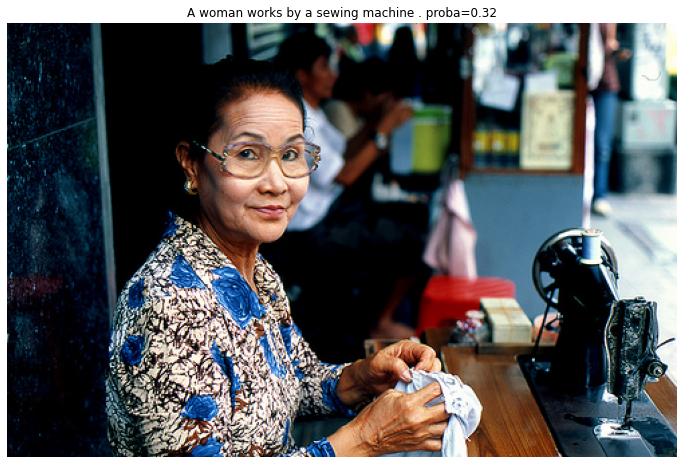

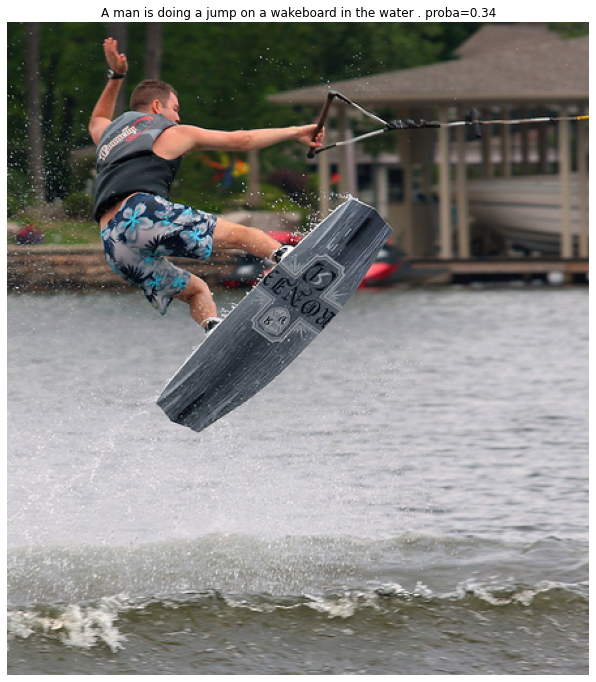

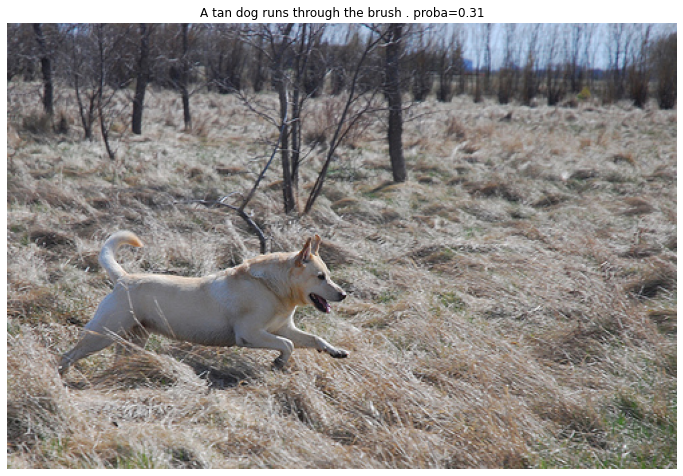

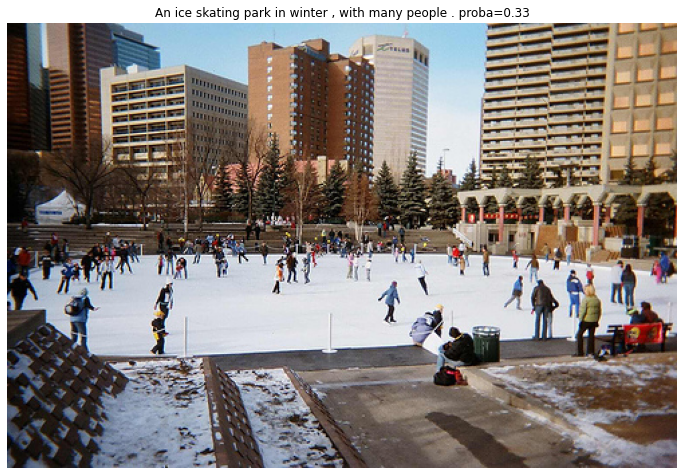

In [ ]:
for result in results:
    text, top_score = result
    if not isinstance(top_score, str):
        for i in range(len(top_score)):
            score = top_score.iloc[i]['cos_sim_score']
            image_name = top_score.iloc[i]['image']
            img = Image.open(f"datasets/to_upload/test_images/{image_name}")
            plt.figure(figsize=(12,12))
            plt.axis ('off')
            plt.imshow(img)
            plt.title(text + " proba=" + str(round(score,2)))
    else:
        print(text)
        print("This image is unavailable in your country in compliance with local laws")

Вывод: целью проекта было создать модель, которая берет запрос от пользователя, проверяет его на наличие запрещенного контента и выводит релевантную картинку. В нашем распоряжении была обучающая выборка с оценками релевантности текста и изображения, сделанная специалистами и пользователеми. Мы взяли оценки специалистов и крауд, и отобрали их по способу суммарного таргета 0.6 к 0.4. Далее мы векторизовали запросы с помощью small bert, а изображения с помощью ResNet50. Далее мы построили 2 нейронных сети решающих задачу, как с точки зрения регрессии, так и классификации. Обе показали плохой результат. Взяв модель классификации, мы протестировали ее на 10 рендомных семплах из теста и нашли релевантные изображения. Получился видимый плохой результат. Возможно, решение, в увеличении размера датасета запросов и картинок.